In [1]:
#필요한 라이브러리를 로드합니다. 
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

In [2]:
IMAGE_SIZE=224
BATCH_SIZE=32

### Albumentations
- `Compose()` : 다양한 augmentation 기법을 확률적으로 적용

In [3]:
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train=True):
  if is_train:
    # 훈련용 데이터일 경우
    return Compose([
        # 50%의 확률로 좌우대칭
        HorizontalFlip(p=0.5),
        # 50%의 확률로 RandomSizedCrop
        RandomSizedCrop(
            min_max_height=(300, 370),
            w2h_ratio=370/1242,
            height=IMAGE_SIZE,
            width=IMAGE_SIZE,
            p=0.5
            ),
        # 입력이미지를 224X224로 resize
        Resize(
            width=IMAGE_SIZE,
            height=IMAGE_SIZE
            )
        ])

  # 테스트용 데이터일 경우
  # 224X224로 resize만 수행
  return Compose([
                Resize(
                    width=IMAGE_SIZE,
                    height=IMAGE_SIZE
                    )
                ])

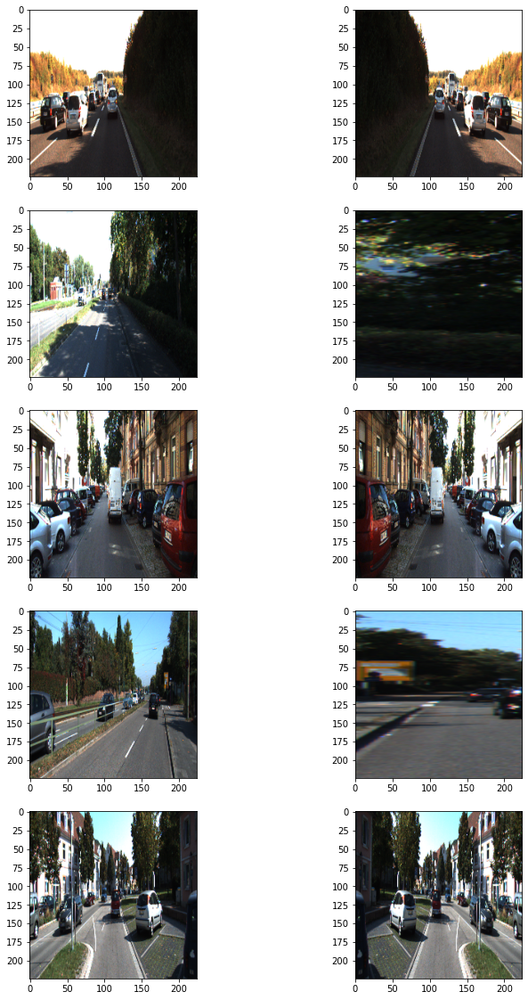

In [4]:
dir_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/data/training'

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_images = glob(os.path.join(dir_path, "image_2", "*.png"))

# 훈련 데이터셋에서 5개만 가져와 augmentation을 적용
plt.figure(figsize=(12, 20))
for i in range(5):
    image = imread(input_images[i]) 
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지
  
plt.show()

In [5]:
class KittiGenerator(tf.keras.utils.Sequence):
  '''
  KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
  우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
  '''
  def __init__(self, 
               dir_path,
               batch_size=BATCH_SIZE,
               img_size=(IMAGE_SIZE, IMAGE_SIZE, 3),
               output_size=(IMAGE_SIZE, IMAGE_SIZE),
               is_train=True,
               augmentation=None):
    '''
    dir_path: dataset의 directory path입니다.
    batch_size: batch_size입니다.
    img_size: preprocess에 사용할 입력이미지의 크기입니다.
    output_size: ground_truth를 만들어주기 위한 크기입니다.
    is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
    augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
    '''
    self.dir_path = dir_path
    self.batch_size = batch_size
    self.is_train = is_train
    self.dir_path = dir_path
    self.augmentation = augmentation
    self.img_size = img_size
    self.output_size = output_size

    # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
    self.data = self.load_dataset()

  def load_dataset(self):
    # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
    # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
    input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
    label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
    input_images.sort()
    label_images.sort()
    assert len(input_images) == len(label_images)
    data = [ _ for _ in zip(input_images, label_images)]

    if self.is_train:
      return data[:-30]
    return data[-30:]
    
  def __len__(self):
    # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
    return math.ceil(len(self.data) / self.batch_size)

  def __getitem__(self, index):
    # 입력과 출력을 만듭니다.
    # 입력은 resize및 augmentation이 적용된 input image이고 
    # 출력은 semantic label입니다.
    batch_data = self.data[
                           index*self.batch_size:
                           (index + 1)*self.batch_size
                           ]
    inputs = np.zeros([self.batch_size, *self.img_size])
    outputs = np.zeros([self.batch_size, *self.output_size])
        
    for i, data in enumerate(batch_data):
      input_img_path, output_path = data
      _input = imread(input_img_path)
      _output = imread(output_path)
      _output = (_output==7).astype(np.uint8)*1
      data = {
          "image": _input,
          "mask": _output,
          }
      augmented = self.augmentation(**data)
      inputs[i] = augmented["image"]/255
      outputs[i] = augmented["mask"]
    return inputs, outputs

  def on_epoch_end(self):
    # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
    self.indexes = np.arange(len(self.data))
    if self.is_train == True :
      np.random.shuffle(self.indexes)
      return self.indexes

In [6]:
augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    dir_path, 
    augmentation=augmentation,
)

test_generator = KittiGenerator(
    dir_path, 
    augmentation=test_preproc,
    is_train=False
)

### 시맨틱 세그멘테이션 모델
- U-Net 구현
- 입력 이미지의 크기 : 데이터셋에 맞게
- 사용에 필요한 레이어와 연산
  - Conv2D, Conv2DTranspose, MaxPooling2D, concatenate
  - 필요에 따라 Dropout 등 적용

In [30]:
import tensorflow as tf
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, MaxPooling2D, Input, concatenate
from tensorflow.keras.models import Model
from keras import regularizers

def conv_block(inputs, num_filters, is_dropout=False):
    if is_dropout:
        x = Conv2D(num_filters, (3, 3), activation=None, padding='same', kernel_regularizer=regularizers.L2(1e-4))(inputs)
        x = BatchNormalization()(x)
        x = tf.keras.activations.relu(x)
        x = Conv2D(num_filters, (3, 3), activation=None, padding='same', kernel_regularizer=regularizers.L2(1e-4))(x)
        x = BatchNormalization()(x)
        x = tf.keras.activations.relu(x)
        x = Dropout(0.5)(x)
    else:
        x = Conv2D(num_filters, (3, 3), activation='relu', padding='same')(inputs)
        x = Conv2D(num_filters, (3, 3), activation='relu', padding='same')(x)
    return x

def build_unet(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), is_dropout=False):
    inputs = Input(shape=input_shape)
    
    # Number of filters at each level
    filter_sizes = [64, 128, 256, 512, 1024]
    
    ####
    # Contracting Path
    ####
    skips = []
    x = inputs
    # Exclude the bottleneck layer
    for filters in filter_sizes[:-1]:
        x = conv_block(x, filters, is_dropout=is_dropout)
        skips.append(x)
        x = MaxPooling2D((2, 2))(x)

    ####
    # Bottleneck
    x = conv_block(x, filter_sizes[-1])

    ####
    # Expanding Path
    ####
    # Reverse to align with expanding path
    skips.reverse()
    # Iterate backwards through filters
    for filters, skip in zip(filter_sizes[-2::-1], skips):
        x = Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same')(x)
        x = concatenate([x, skip])
        x = conv_block(x, filters, is_dropout=False)
    
    # Binary segmentation
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(x)

    model = Model(inputs, outputs)
    return model

In [22]:
# model = build_model()
# model.summary()
unet = build_unet()
unet.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv2d_95 (Conv2D)              (None, 224, 224, 64) 1792        input_9[0][0]                    
__________________________________________________________________________________________________
conv2d_96 (Conv2D)              (None, 224, 224, 64) 36928       conv2d_95[0][0]                  
__________________________________________________________________________________________________
max_pooling2d_20 (MaxPooling2D) (None, 112, 112, 64) 0           conv2d_96[0][0]                  
____________________________________________________________________________________________

In [25]:
def build_unet_plusplus(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), is_dropout=False):
    inputs = Input(shape=input_shape)
    
    # Number of filters at each level
    filter_sizes = [64, 128, 256, 512, 1024]
    
    # Contracting Path
    skips = []
    x = inputs
    # Exclude the bottleneck layer
    for filters in filter_sizes[:-1]:
        x = conv_block(x, filters, is_dropout=is_dropout)
        skips.append(x)
        x = MaxPooling2D((2, 2))(x)

    # Bottleneck
    x = conv_block(x, filter_sizes[-1], is_dropout=is_dropout)

    # Expanding Path with Nested Skip Connections (U-Net++)
    # Reverse to align with expanding path
    skips.reverse()
    # Start with the bottleneck layer for the first skip connection
    skip_layers = [x]
    
    # Iterate backwards through filters
    for filters, skip in zip(filter_sizes[-2::-1], skips):
        x = Conv2DTranspose(filters, (2, 2), strides=(2, 2), padding='same')(x)
        x = concatenate([x, skip])
        
        # Adding nested skip connections by concatenating intermediate outputs
        # Add previous skip layers as well
        for skip_layer in skip_layers:
            x = concatenate([x, skip_layer])
        
        x = conv_block(x, filters, is_dropout=False)
        
        # Save the current output for future skip connections
        skip_layers.append(x)
    
    # Binary segmentation
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(x)

    model = Model(inputs, outputs)
    return model

### 모델 학습
- UNet w.o. regulations
- UNet w. regulations

In [27]:
EPOCH=100
LEARNING_RATE=1e-4

In [28]:
unet_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet_without_dropout.h5'

unet = build_unet()
unet.compile(optimizer = Adam(LEARNING_RATE), loss = 'binary_crossentropy')

unet_history = unet.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=EPOCH,
 )

unet.save(unet_path)

Epoch 1/100
6/6 [==============================] - 39s 2s/step - loss: 0.6940 - val_loss: 0.6812
Epoch 2/100
6/6 [==============================] - 8s 1s/step - loss: 0.6717 - val_loss: 0.6540
Epoch 3/100
6/6 [==============================] - 9s 1s/step - loss: 0.6304 - val_loss: 0.6197
Epoch 4/100
6/6 [==============================] - 9s 1s/step - loss: 0.6223 - val_loss: 0.6025
Epoch 5/100
6/6 [==============================] - 9s 1s/step - loss: 0.5963 - val_loss: 0.5818
Epoch 6/100
6/6 [==============================] - 9s 1s/step - loss: 0.5697 - val_loss: 0.5370
Epoch 7/100
6/6 [==============================] - 8s 1s/step - loss: 0.5316 - val_loss: 0.5124
Epoch 8/100
6/6 [==============================] - 8s 1s/step - loss: 0.4741 - val_loss: 0.4324
Epoch 9/100
6/6 [==============================] - 9s 1s/step - loss: 0.3789 - val_loss: 0.3884
Epoch 10/100
6/6 [==============================] - 9s 1s/step - loss: 0.3379 - val_loss: 0.3912
Epoch 11/100
6/6 [====================

In [31]:
unet_reg_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/seg_model_unet_with_dropout.h5'

unet_reg = build_unet(is_dropout=True)
unet_reg.compile(optimizer = Adam(LEARNING_RATE), loss = 'binary_crossentropy')

unet_reg_history = unet_reg.fit(
     train_generator,
     validation_data=test_generator,
     steps_per_epoch=len(train_generator),
     epochs=EPOCH,
 )

unet_reg.save(unet_reg_path)

Epoch 1/100
6/6 [==============================] - 15s 2s/step - loss: 0.8430 - val_loss: 0.8361
Epoch 2/100
6/6 [==============================] - 10s 1s/step - loss: 0.6246 - val_loss: 0.8208
Epoch 3/100
6/6 [==============================] - 10s 1s/step - loss: 0.5485 - val_loss: 0.8186
Epoch 4/100
6/6 [==============================] - 10s 1s/step - loss: 0.5029 - val_loss: 0.8157
Epoch 5/100
6/6 [==============================] - 9s 1s/step - loss: 0.4811 - val_loss: 0.8311
Epoch 6/100
6/6 [==============================] - 10s 1s/step - loss: 0.4473 - val_loss: 0.8452
Epoch 7/100
6/6 [==============================] - 10s 2s/step - loss: 0.4026 - val_loss: 0.8614
Epoch 8/100
6/6 [==============================] - 10s 1s/step - loss: 0.3875 - val_loss: 0.8807
Epoch 9/100
6/6 [==============================] - 10s 1s/step - loss: 0.3673 - val_loss: 0.9095
Epoch 10/100
6/6 [==============================] - 9s 1s/step - loss: 0.3349 - val_loss: 0.9497
Epoch 11/100
6/6 [=============

In [32]:
import pandas as pd

def save_history_to_csv_path(history, csv_path):
    history_data = history.history
    df = pd.DataFrame(history_data)
    df.to_csv(csv_path, index=False)

In [34]:
def visualize_history(history, title):
    plt.figure(figsize=(12, 5))

    # Plot loss
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.plot(history.history['loss'], label='Training Loss')
    plt.title(f'{title} - Loss')
    plt.legend()

    plt.show()

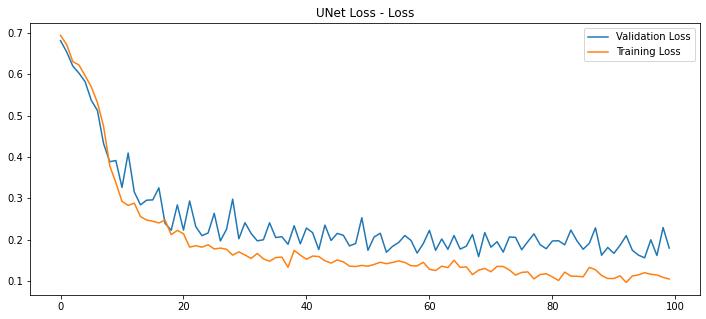

In [35]:
visualize_history(unet_history, "UNet Loss")

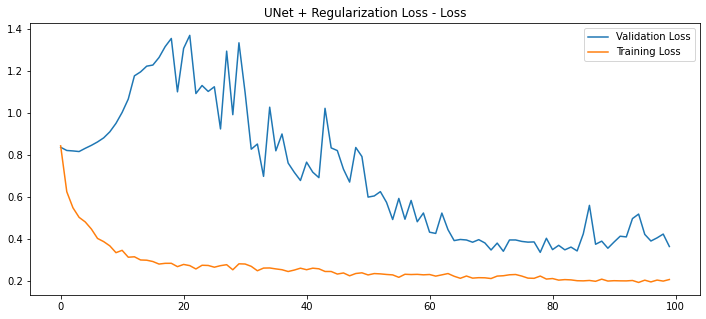

In [36]:
visualize_history(unet_reg_history, "UNet + Regularization Loss")

In [40]:
unet_history_csv_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/history/unet_history.csv'
save_history_to_csv_path(unet_history, unet_history_csv_path)

In [41]:
unet_reg_history_csv_path = os.getenv('HOME')+'/aiffel/semantic_segmentation/history/unet_reg_history.csv'
save_history_to_csv_path(unet_reg_history, unet_reg_history_csv_path)

### 모델 시각화

In [ ]:
model_path = dir_path + '/seg_model_unet.h5' 

model = tf.keras.models.load_model(model_path)

In [42]:
def calculate_iou_score(target, prediction):
    intersection = np.logical_and(target, prediction)
    union = np.logical_or(target, prediction)
    iou_score = float(np.sum(intersection)) / float(np.sum(union))
    print('IoU : %f' % iou_score )
    return iou_score

In [43]:
def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    
    # predict
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255  #0.5라는 threshold를 변경하면 도로인식 결과범위가 달라집니다.
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    
    output = Image.blend(background, output, alpha=0.5)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1   # 라벨에서 도로로 기재된 영역

        return output, prediction, target
    else:
        return output, prediction, _

In [44]:
def test(model, dataset):
    for i in range(1, 10):
        output, prediction, target = get_output(
            model, 
            dataset,
            image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
            output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
            label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
        )
        calculate_iou_score(target, prediction)

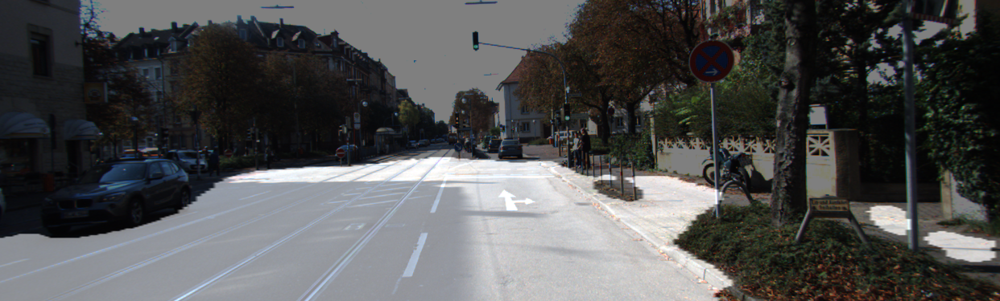

IoU : 0.846416


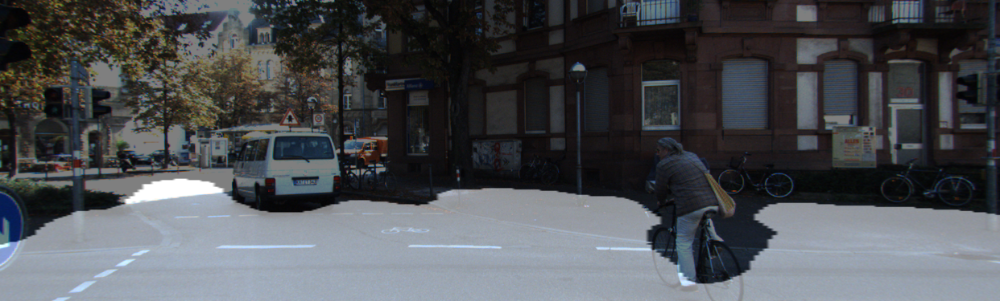

IoU : 0.682254


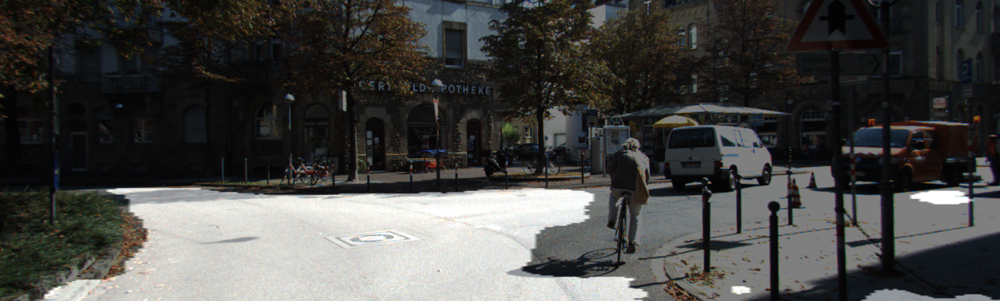

IoU : 0.702937


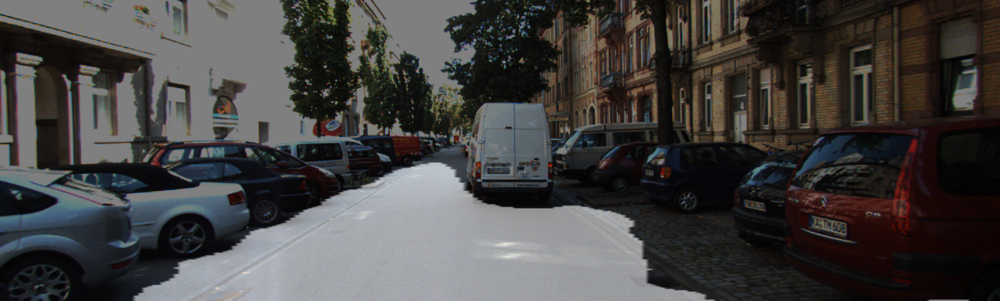

IoU : 0.784419


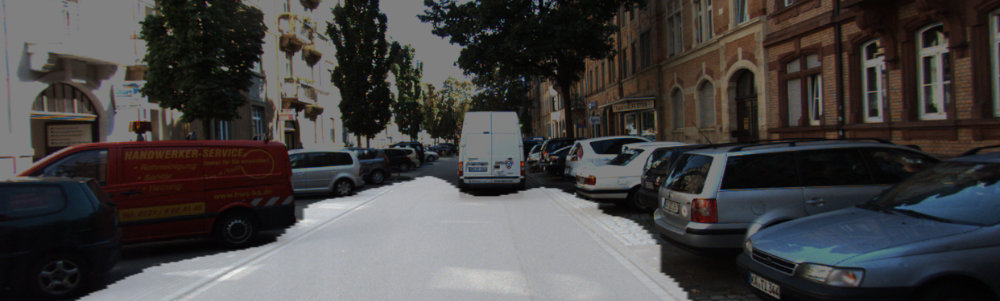

IoU : 0.758299


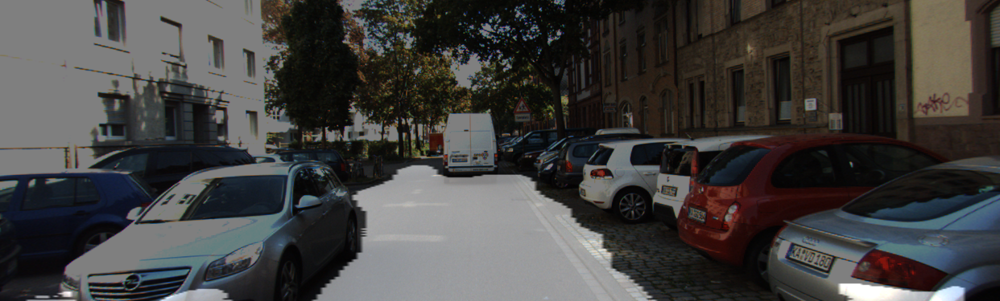

IoU : 0.762786


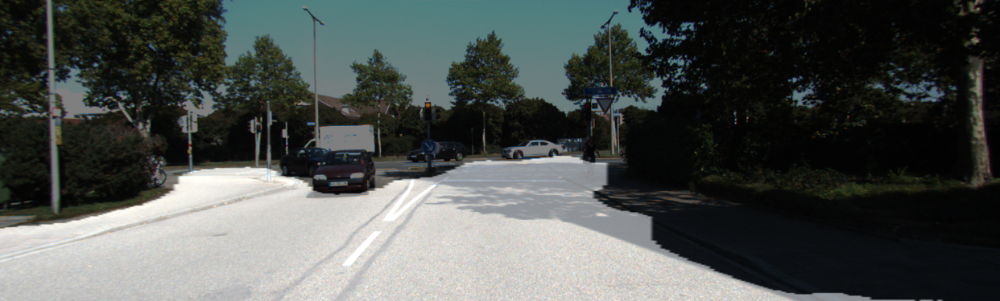

IoU : 0.841594


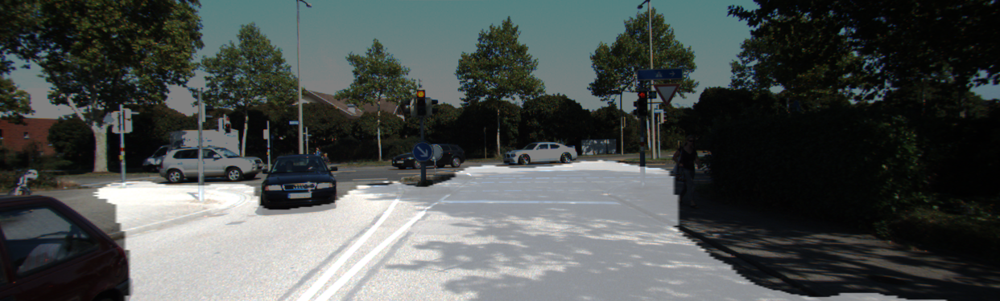

IoU : 0.823829


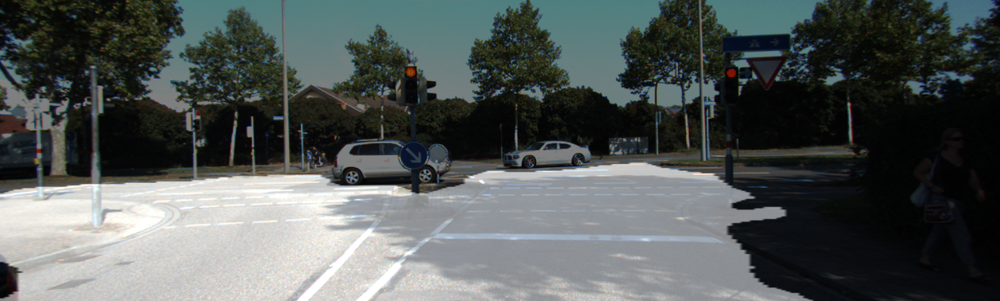

IoU : 0.778922


In [45]:
test(unet, test_preproc)

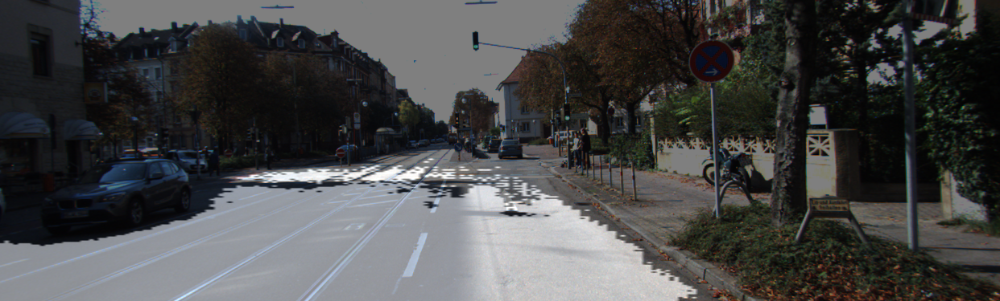

IoU : 0.816152


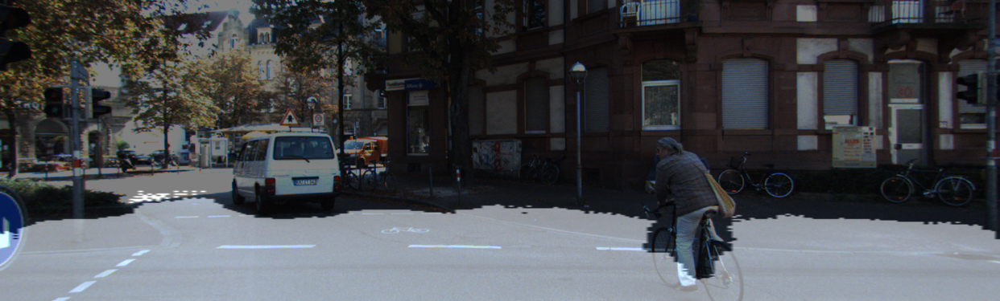

IoU : 0.694644


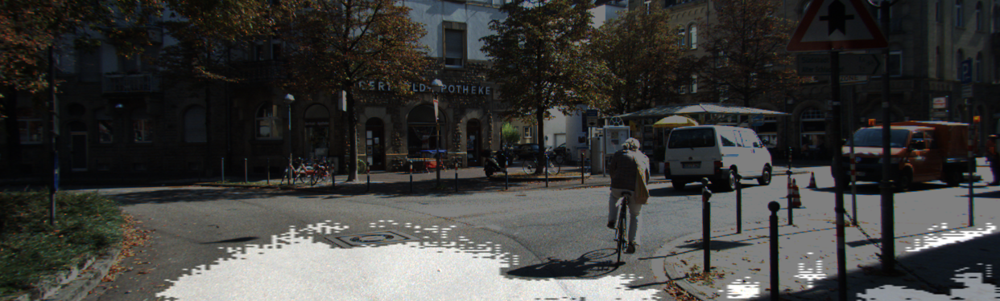

IoU : 0.294457


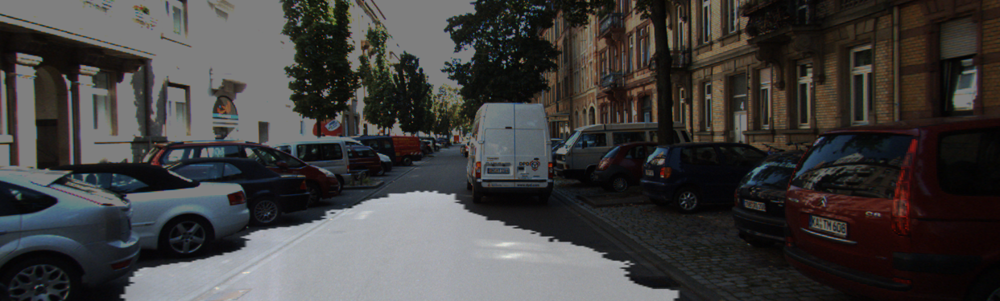

IoU : 0.684970


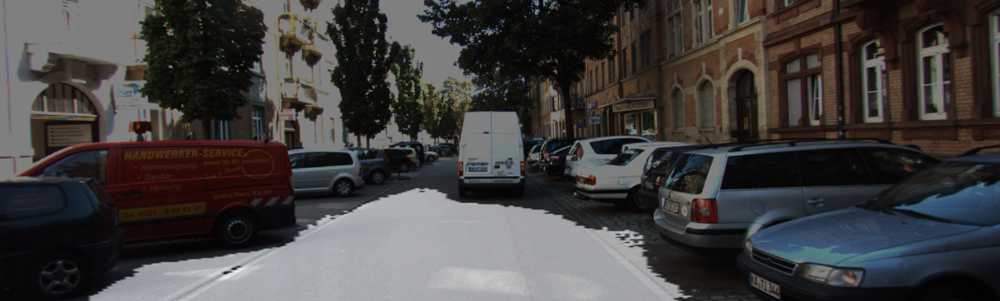

IoU : 0.798538


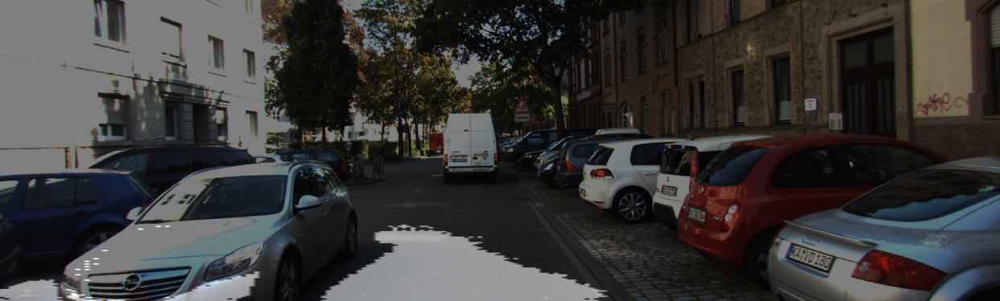

IoU : 0.392072


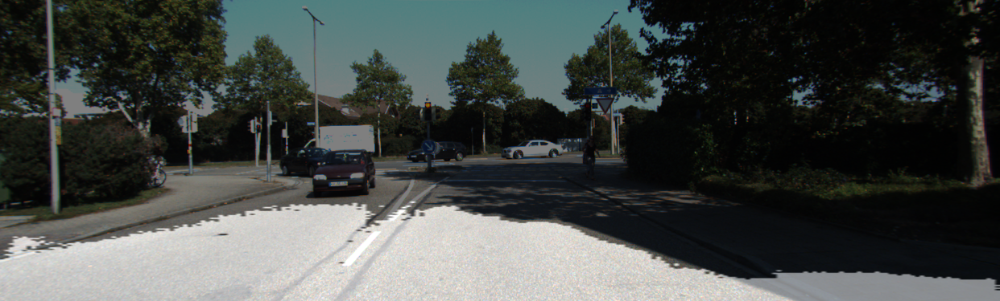

IoU : 0.657504


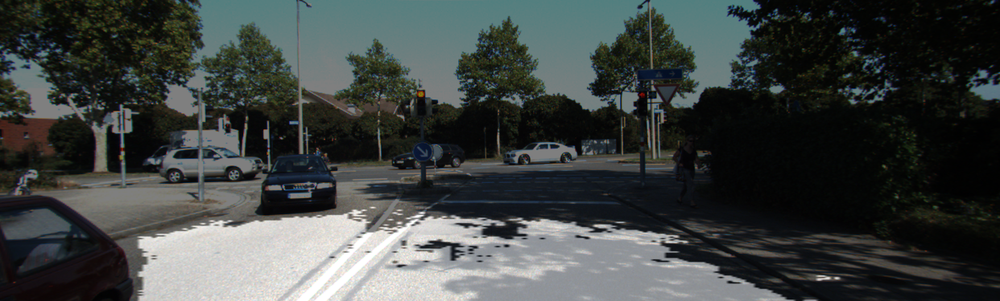

IoU : 0.626782


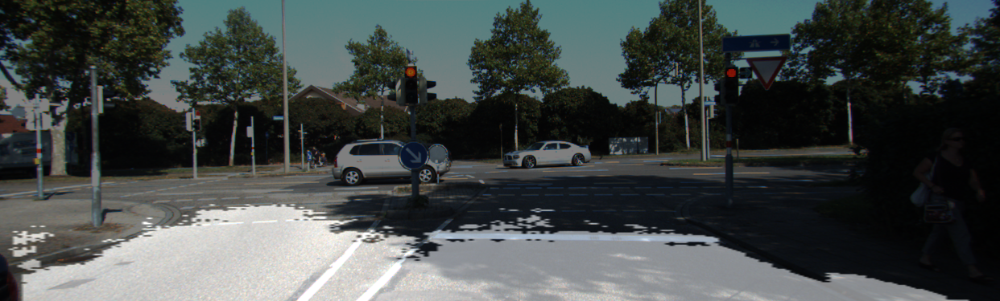

IoU : 0.601063


In [47]:
test(unet_reg, test_preproc)

### 프로젝트

#### Step 1. KITTI 데이터셋 수집과 구축

다운로드한 KITTI 데이터에 data augmentation을 적용한 형태로 데이터셋을 구축합니다. 이때 주의할 점이 있습니다. U-Net++는 메모리 사용량이 U-Net보다 꽤 많아집니다. 그러니 **배치 사이즈를 적절히 줄여서** 설정하시기를 권합니다.

#### Step 2. U-Net++ 모델의 구현

U-Net의 모델 구조와 소스코드를 면밀히 비교해 보다 보면, U-Net++를 어떻게 구현할 수 있을지에 대한 방안을 떠올릴 수 있을 것입니다. 이 과정을 통해 U-Net 자체에 대한 이해도도 증진될 것입니다. 그 외 적절히 U-Net의 백본 구조, 기타 파라미터 변경 등을 통해 추가적인 성능 향상이 가능할 수도 있습니다.

#### Step 3. U-Net 과 U-Net++ 모델이 수행한 세그멘테이션 결과 분석

두 모델의 정량적, 정성적 성능을 비교해 봅시다. 시각화, IoU 계산 등을 체계적으로 시도해 보면 차이를 발견하실 수 있을 것입니다.

### 평가문항

1. U-Net을 통한 세그멘테이션 작업이 정상적으로 진행되었는가?
   - KITTI 데이터셋 구성, U-Net 모델 훈련, 결과물 시각화의 한 사이클이 정상 수행되어 세그멘테이션 결과 이미지를 제출하였다.
2. U-Net++ 모델이 성공적으로 구현되었는가?
   - U-Net++ 모델을 스스로 구현하여 학습 진행 후 세그멘테이션 결과까지 정상 진행되었다.
3. U-Net과 U-Net++ 두 모델의 성능이 정량적/정성적으로 잘 비교되었는가?
   - U-Net++ 의 세그멘테이션 결과 사진과 IoU 계산치를 U-Net과 비교하여 우월함을 확인하였다.